# 📌 Clasificador de Cáncer de Mama a través de Muestras Histopatológicas

## Bibliotecas

In [1]:
# ===============================
# 1. Módulos del sistema y gestión de archivos
# ===============================
import os
from os import listdir
from pathlib import Path
import glob
import zipfile

# ===============================
# 2. Módulos para manejo de datos
# ===============================
import pandas as pd
import numpy as np

# ===============================
# 3. Módulos para visualización
# ===============================
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from matplotlib.image import imread

# ===============================
# 4. Módulos para manipulación de imágenes
# ===============================
import cv2
from keras.preprocessing import image

# ===============================
# 5. Módulos para Machine Learning y Deep Learning
# ===============================
import tensorflow as tf
#from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import keras
import sklearn
# ===============================
# 6. Módulos para PyTorch
# ===============================
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms

# ===============================
# 7. Otros módulos
# ===============================
import requests
import random
import datetime

In [2]:

# ===============================
# CONFIGURACIÓN
# ===============================

# Verificar disponibilidad de GPUs en TensorFlow
print("Num GPUs Available (TensorFlow):", len(tf.config.experimental.list_physical_devices('GPU')))
print(f"TensorFlow version: {tf.__version__}")

# Verificar disponibilidad de GPU en PyTorch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device (PyTorch): {device}")

# Configurar semilla aleatoria para reproducibilidad
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
tf.random.set_seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

# Configuración de TensorFlow para evitar uso excesivo de memoria en GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("GPU memory growth enabled (TensorFlow)")
    except RuntimeError as e:
        print(e)

# Configurar uso de GPU en PyTorch si está disponible
if torch.cuda.is_available():
    torch.backends.cudnn.benchmark = True  # Optimiza el rendimiento en GPU
    torch.backends.cudnn.deterministic = True  # Para mayor reproducibilidad
    print("CUDA enabled (PyTorch)")

print(f"Keras version: {keras.__version__}")
print(f"OpenCV version: {cv2.__version__}")
print(f"Scikit-learn version: {sklearn.__version__}")

# Mostrar información del entorno
import sys
print(f"Python version: {sys.version}")
print(f"Operating System: {os.name}")

Num GPUs Available (TensorFlow): 1
TensorFlow version: 2.18.0
Using device (PyTorch): cuda
GPU memory growth enabled (TensorFlow)
CUDA enabled (PyTorch)
Keras version: 3.8.0
OpenCV version: 4.11.0
Scikit-learn version: 1.6.1
Python version: 3.11.11 (main, Dec  4 2024, 08:55:07) [GCC 11.4.0]
Operating System: posix


## Conjunto de Datos

In [3]:
%%time
# URL del archivo
url = "https://www.inf.ufpr.br/vri/databases/BreaKHis_v1.tar.gz"
# Nombre del archivo de salida
file_name = "BreaKHis_v1.tar.gz"
# Descargar el archivo
response = requests.get(url, stream=True)
# Guardar el archivo en el sistema
with open(file_name, "wb") as file:
    for chunk in response.iter_content(chunk_size=1024):
        file.write(chunk)
print(f"Descarga completa: {file_name}")

Descarga completa: BreaKHis_v1.tar.gz
CPU times: user 35.4 s, sys: 9.62 s, total: 45 s
Wall time: 7min 15s


In [4]:
!mkdir BreaKHis_v1
!tar -xvzf BreaKHis_v1.tar.gz -C BreaKHis_v1

Streaming output truncated to the last 5000 lines.
BreaKHis_v1/histology_slides/breast/malignant/SOB/mucinous_carcinoma/SOB_M_MC_14-13413/200X/SOB_M_MC-14-13413-200-007.png
BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-5694/100X/SOB_M_DC-14-5694-100-012.png
BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14946/400X/SOB_M_DC-14-14946-400-003.png
BreaKHis_v1/histology_slides/breast/malignant/SOB/lobular_carcinoma/SOB_M_LC_14-15570/400X/SOB_M_LC-14-15570-400-015.png
BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-15572/40X/SOB_M_DC-14-15572-40-021.png
BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-14946/40X/SOB_M_DC-14-14946-40-029.png
BreaKHis_v1/histology_slides/breast/malignant/SOB/ductal_carcinoma/SOB_M_DC_14-16716/400X/SOB_M_DC-14-16716-400-030.png
BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/400X/SOB_B_A-14-22549AB-400-021.png
B


# CARGA DEL CONJUNTO DE DATOS

In [5]:
breast_img_paths = glob.glob('/content/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/**/*.png', recursive = True)

# Análisis Exploratorio de Datos (EDA)

In [6]:
# Crear un DataFrame a partir de las rutas
df = pd.DataFrame(breast_img_paths , columns=["Image"])

In [7]:
# Expresión regular para extraer información de la ruta de la imagen
pattern = r"(?P<Procedure>SOB)_(?P<Type>B|M)_(?P<Subtype>A|F|PT|TA|DC|LC|MC|PC)-(?P<Year>\d+)-(?P<SlideID>[\w\d]+)-(?P<Magnification>\d+)-(?P<ImageNumber>\d+)\.png"

# Aplicar regex a la columna "Image" y extraer información en nuevas columnas
df_extracted = df["Image"].str.extract(pattern)

# Unir los datos extraídos al DataFrame original
df = pd.concat([df, df_extracted], axis=1)

# Mostrar el DataFrame con las nuevas columnas
df.head() # Muestra las primeras filas del DataFrame actualizado


,Image,Procedure,Type,Subtype,Year,SlideID,Magnification,ImageNumber
0,/content/BreaKHis_v1/BreaKHis_v1/histology_sli...,SOB,B,PT,14,21998AB,200,007
1,/content/BreaKHis_v1/BreaKHis_v1/histology_sli...,SOB,B,PT,14,21998AB,200,023
2,/content/BreaKHis_v1/BreaKHis_v1/histology_sli...,SOB,B,PT,14,21998AB,200,034
3,/content/BreaKHis_v1/BreaKHis_v1/histology_sli...,SOB,B,PT,14,21998AB,200,013
4,/content/BreaKHis_v1/BreaKHis_v1/histology_sli...,SOB,B,PT,14,21998AB,200,044


In [8]:
df_pivot = df.pivot_table(values="Image", index="Magnification", columns="Type", aggfunc="count", fill_value=0)
df_pivot

Type,B,M
Magnification,,
100,644,1437
200,623,1390
40,625,1370
400,588,1232


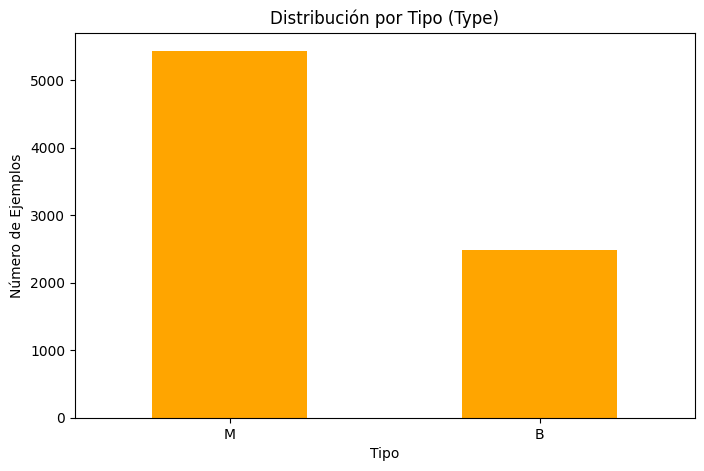

In [9]:
# Contar ocurrencias de cada tipo (Type) y subtipo (Subtype)
type_counts = df["Type"].value_counts()
subtype_counts = df["Subtype"].value_counts()

# Crear gráfica de barras para "Type"
plt.figure(figsize=(8, 5))
type_counts.plot(kind='bar', rot=0, color="orange")
plt.title("Distribución por Tipo (Type)")
plt.xlabel("Tipo")
plt.ylabel("Número de Ejemplos")
plt.show()

In [10]:
import tensorflow as tf
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Función para cargar imágenes desde sus rutas
def load_images_from_paths(image_paths, size=(128, 128)):
    images = []
    for path in image_paths:
        img = cv2.imread(path)  # Cargar la imagen desde el disco
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convertir de BGR a RGB
            img = cv2.resize(img, size)  # Redimensionar al tamaño deseado
            images.append(img)
    return images

# Separar imágenes benignas y malignas según la columna "Type"
benign_paths = df[df["Type"] == "B"]["Image"].tolist()
malignant_paths = df[df["Type"] == "M"]["Image"].tolist()

benign_images = load_images_from_paths(benign_paths)
malignant_images = load_images_from_paths(malignant_paths)

# Aumento de datos para imágenes benignas
def augment_images(images):
    augmented_images = []
    for img in images:
        img_tensor = tf.convert_to_tensor(img, dtype=tf.float32)
        img_tensor = img_tensor / 255.0  # Normalizar los valores de los píxeles
        augmented_images.append(img_tensor)  # Imagen original

        # Rotación de 90° y 180° y espejado
        for k in [1, 2]:
            rotated_img = tf.image.rot90(img_tensor, k=k)
            mirrored_img = tf.image.flip_left_right(rotated_img)
            augmented_images.append(mirrored_img)
    return augmented_images

# Aplicar aumento de datos a imágenes benignas
augmented_benign_images = augment_images(benign_images)

# Combinar imágenes benignas (aumentadas) y malignas
all_images = np.array(augmented_benign_images + [tf.convert_to_tensor(img / 255.0, dtype=tf.float32) for img in malignant_images])
all_labels = np.array([0] * len(augmented_benign_images) + [1] * len(malignant_images))


In [11]:
# Dividir los datos en entrenamiento, validación y prueba
X_train, X_temp, y_train, y_temp = train_test_split(all_images, all_labels, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [12]:
# Verificar tamaños de los conjuntos
sizes = {
    "Conjunto": ["Entrenamiento", "Validación", "Prueba"],
    "Tamaño": [len(y_train), len(y_val), len(y_test)],
    "Proporción (%)": [
        len(y_train) / (len(y_train) + len(y_val) + len(y_test)) * 100,
        len(y_val) / (len(y_train) + len(y_val) + len(y_test)) * 100,
        len(y_test) / (len(y_train) + len(y_val) + len(y_test)) * 100
    ]
}

# Distribución de clases en cada conjunto con proporciones
def class_distribution_with_proportion(y, name):
    unique, counts = np.unique(y, return_counts=True)
    total = sum(counts)
    return pd.DataFrame({
        "Conjunto": [name] * len(unique),
        "Clase": unique,
        "Frecuencia": counts,
        "Proporción (%)": (counts / total) * 100
    })

train_dist = class_distribution_with_proportion(y_train, "Entrenamiento")
val_dist = class_distribution_with_proportion(y_val, "Validación")
test_dist = class_distribution_with_proportion(y_test, "Prueba")

# Combinar todas las distribuciones
class_distributions = pd.concat([train_dist, val_dist, test_dist], ignore_index=True)

# Crear DataFrame de tamaños
sizes_df = pd.DataFrame(sizes)

print("Distribución de clases en cada conjunto:")
print(class_distributions)

print("\nTamaños de los conjuntos:")
print(sizes_df)

Distribución de clases en cada conjunto:
        Conjunto  Clase  Frecuencia  Proporción (%)
0  Entrenamiento      0        5178       57.482238
1  Entrenamiento      1        3830       42.517762
2     Validación      0        1115       57.772021
3     Validación      1         815       42.227979
4         Prueba      0        1147       59.399275
5         Prueba      1         784       40.600725

Tamaños de los conjuntos:
        Conjunto  Tamaño  Proporción (%)
0  Entrenamiento    9008       69.997669
1     Validación    1930       14.997280
2         Prueba    1931       15.005051


## MODELO 1

In [13]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.25),  # Regularización
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Dropout(0.25),  # Regularización
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    tf.keras.layers.Dropout(0.5),  # Regularización
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Compilar el modelo
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [14]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=10, restore_best_weights=True
)
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=80,
    batch_size=32,
    callbacks=[early_stopping]
)

Epoch 1/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.6861 - loss: 1.2728 - val_accuracy: 0.8155 - val_loss: 0.5005
Epoch 2/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7797 - loss: 0.5254 - val_accuracy: 0.8254 - val_loss: 0.4549
Epoch 3/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7891 - loss: 0.5130 - val_accuracy: 0.8301 - val_loss: 0.4517
Epoch 4/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7924 - loss: 0.4920 - val_accuracy: 0.8301 - val_loss: 0.4397
Epoch 5/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7960 - loss: 0.4978 - val_accuracy: 0.8321 - val_loss: 0.4330
Epoch 6/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.8008 - loss: 0.4881 - val_accuracy: 0.8197 - val_loss: 0.4421
Epoch 7/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7976 - loss: 0.4888 - val_accuracy: 0.8358 - val_loss: 0.4131
Epoch 8/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7976 - loss: 0.4882 - val_accuracy: 

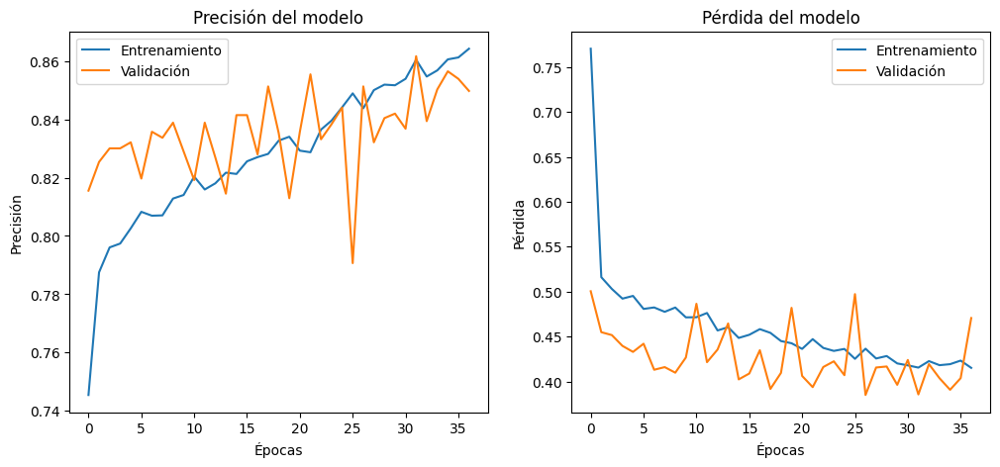

In [15]:
# Graficar la historia del entrenamiento
plt.figure(figsize=(12, 5))

# Precisión
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Entrenamiento')
plt.plot(history.history['val_accuracy'], label='Validación')
plt.title('Precisión del modelo')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

# Pérdida
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Entrenamiento')
plt.plot(history.history['val_loss'], label='Validación')
plt.title('Pérdida del modelo')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()

plt.show()

61/61 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


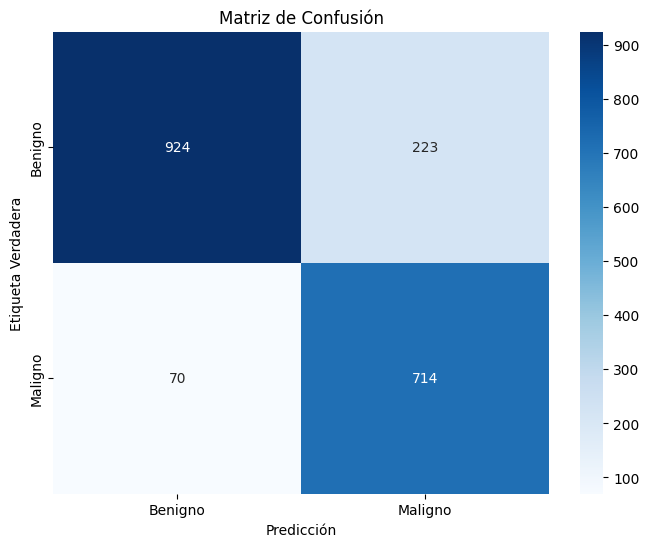

Reporte de Métricas:

              precision    recall  f1-score   support

     Benigno       0.93      0.81      0.86      1147
     Maligno       0.76      0.91      0.83       784

    accuracy                           0.85      1931
   macro avg       0.85      0.86      0.85      1931
weighted avg       0.86      0.85      0.85      1931



In [16]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Suponiendo que `binary_model` es tu modelo entrenado
# Predecir las probabilidades para el conjunto de prueba
y_pred_probs = model.predict(X_test)  # Predicciones como probabilidades
y_pred = (y_pred_probs > 0.5).astype(int)  # Convertir probabilidades en etiquetas binarias (0 o 1)

# Crear la matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)

# Graficar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Benigno", "Maligno"], yticklabels=["Benigno", "Maligno"])
plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Etiqueta Verdadera")
plt.show()

# Generar el reporte de métricas
report = classification_report(y_test, y_pred, target_names=["Benigno", "Maligno"])
print("Reporte de Métricas:\n")
print(report)

## MODELO 2

In [17]:
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten, Dropout, Lambda, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [18]:
# Base Model (DenseNet121)
base_model = tf.keras.applications.DenseNet121(
    weights='imagenet',         # Cargar pesos preentrenados
    include_top=False,          # Excluir la capa completamente conectada
    input_shape=(128, 128, 3)   # Tamaño de entrada de las imágenes
)

layer_names = ['conv3_block12_concat', 'conv4_block24_concat', 'conv5_block16_concat']
intermediate_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create a new model that outputs intermediate layers
intermediate_model = Model(inputs=base_model.input, outputs=intermediate_outputs)

# Define the branches for each intermediate output
branch_outputs = []
for output in intermediate_outputs:
    x = GlobalAveragePooling2D()(output)
    x = Lambda(lambda x: tf.math.l2_normalize(x, axis=-1), output_shape=lambda s: s)(x)
    x = Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
    x = BatchNormalization()(x)
    branch_outputs.append(x)
# Concatenate the branch outputs for score-level fusion
fusion = tf.keras.layers.Concatenate()(branch_outputs)

# Final dense layers
x = Dense(16, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(fusion)
x = BatchNormalization()(x)
x = Dropout(0.45)(x)
final_output = Dense(2, activation='softmax')(x)

# Combine everything into a model
binary_model = Model(inputs=base_model.input, outputs=final_output)

optimizer = Adam(learning_rate=0.0001)

binary_model.compile(optimizer=optimizer,
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)


# Entrenar el modelo
history = binary_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=80,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 253s 389ms/step - accuracy: 0.7981 - loss: 0.8401 - val_accuracy: 0.8119 - val_loss: 0.8686 - learning_rate: 1.0000e-04
Epoch 2/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - accuracy: 0.9420 - loss: 0.5220 - val_accuracy: 0.9617 - val_loss: 0.4767 - learning_rate: 1.0000e-04
Epoch 3/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - accuracy: 0.9720 - loss: 0.4211 - val_accuracy: 0.9394 - val_loss: 0.4759 - learning_rate: 1.0000e-04
Epoch 4/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - accuracy: 0.9833 - loss: 0.3687 - val_accuracy: 0.9606 - val_loss: 0.3981 - learning_rate: 1.0000e-04
Epoch 5/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - accuracy: 0.9885 - loss: 0.3262 - val_accuracy: 0.9560 - val_loss: 0.3946 - learning_rate: 1.0000e-04
Epoch 6/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.9878 - loss: 0.3002 - val_accuracy: 0.9632 - val_loss: 0.3349 - learning_rate: 1.0000e-04
Epoch 7/80
282/282 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/s

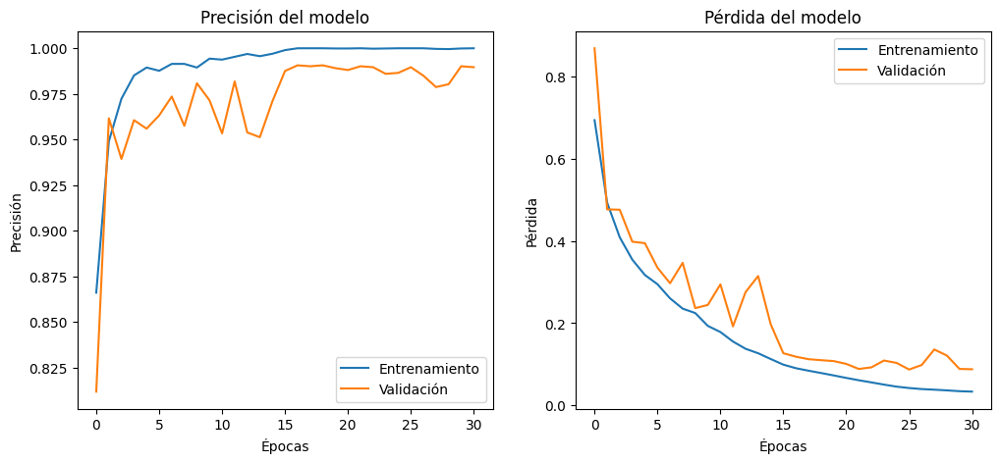

In [19]:
plt.figure(figsize=(12, 5))

# Precisión
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Entrenamiento')
plt.plot(history.history['val_accuracy'], label='Validación')
plt.title('Precisión del modelo')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

# Pérdida
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Entrenamiento')
plt.plot(history.history['val_loss'], label='Validación')
plt.title('Pérdida del modelo')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()

plt.show()

61/61 ━━━━━━━━━━━━━━━━━━━━ 23s 218ms/step


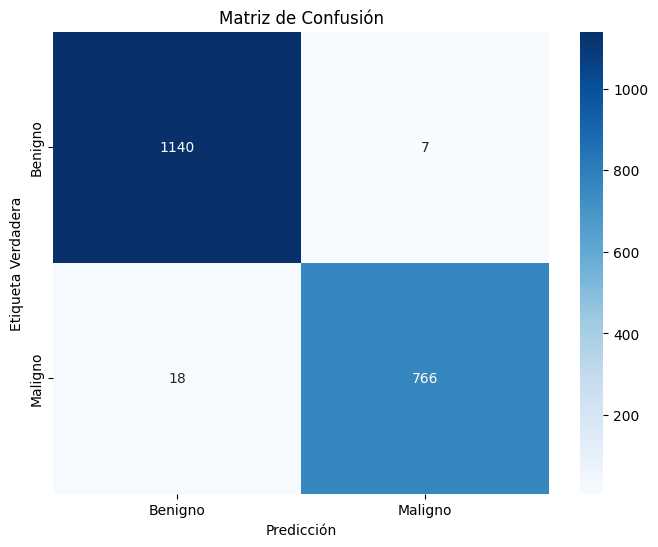

Reporte de Métricas:

              precision    recall  f1-score   support

     Benigno       0.98      0.99      0.99      1147
     Maligno       0.99      0.98      0.98       784

    accuracy                           0.99      1931
   macro avg       0.99      0.99      0.99      1931
weighted avg       0.99      0.99      0.99      1931



In [20]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Suponiendo que ya tienes X_test y y_test definidos
# Predecir las etiquetas para el conjunto de prueba
y_pred_probs = binary_model.predict(X_test)  # Predicciones como probabilidades
y_pred = tf.argmax(y_pred_probs, axis=1).numpy()  # Convertir a etiquetas

# Usar y_test_binary en lugar de y_test
conf_matrix = confusion_matrix(y_test, y_pred)

# Graficar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Benigno", "Maligno"], yticklabels=["Benigno", "Maligno"])
plt.title("Matriz de Confusión")
plt.xlabel("Predicción")
plt.ylabel("Etiqueta Verdadera")
plt.show()

# Generar el reporte de métricas
report = classification_report(y_test, y_pred, target_names=["Benigno", "Maligno"])
print("Reporte de Métricas:\n")
print(report)


## Validación cruzada

La validación cruzada (Cross-Validation, CV) es una técnica utilizada para evaluar el desempeño de un modelo de machine learning dividiendo el conjunto de datos en múltiples subconjuntos o "folds". Esto permite medir la capacidad de generalización del modelo y evitar problemas como el sobreajuste (overfitting).

Para evaluar correctamente nuestro modelo de clasificación de cáncer de mama con DenseNet121, aplicamos K-Fold Cross-Validation de la siguiente manera:

1. Dividimos los datos en K=6 folds.
1.En cada iteración:
  - Entrenamos el modelo en 5 folds.
  - Validamos en el fold restante.
1. Promediamos el desempeño del modelo en los 5 folds.

Esto nos permite evaluar el modelo con diferentes subconjuntos y verificar su robustez y estabilidad.



In [21]:
from tensorflow.keras.applications import DenseNet121
# Función para crear el modelo con arquitectura multi-branch
def create_model(input_shape=(128, 128, 3)):
    # Base Model (DenseNet121)
    base_model = DenseNet121(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )

    layer_names = ['conv3_block12_concat', 'conv4_block24_concat', 'conv5_block16_concat']
    intermediate_outputs = [base_model.get_layer(name).output for name in layer_names]

    # Create a new model that outputs intermediate layers
    intermediate_model = Model(inputs=base_model.input, outputs=intermediate_outputs)

    # Define the branches for each intermediate output
    branch_outputs = []
    for output in intermediate_outputs:
        x = GlobalAveragePooling2D()(output)
        x = Lambda(lambda x: tf.math.l2_normalize(x, axis=-1), output_shape=lambda s: s)(x)
        x = Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
        x = BatchNormalization()(x)
        branch_outputs.append(x)

    # Concatenate the branch outputs for score-level fusion
    fusion = tf.keras.layers.Concatenate()(branch_outputs)

    # Final dense layers
    x = Dense(16, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(fusion)
    x = BatchNormalization()(x)
    x = Dropout(0.45)(x)
    final_output = Dense(2, activation='softmax')(x)

    # Combine everything into a model
    model = Model(inputs=base_model.input, outputs=final_output)

    optimizer = Adam(learning_rate=0.0001)
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model


In [22]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Lambda, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import KFold, train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Primero separamos un conjunto de prueba fijo (15%)
X_train_val, X_test, y_train_val, y_test = train_test_split(all_images, all_labels, test_size=0.15, random_state=42)

# Número de pliegues
n_folds = 6
# Preparar para la validación cruzada K-fold
kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)

# Listas para guardar resultados de cada pliegue
fold_histories = []
fold_roc_curves = []
fold_aucs = []
fold_models = []

# Realizar la validación cruzada K-fold
fold_num = 1
for train_idx, val_idx in kf.split(X_train_val):
    print(f'Entrenando fold {fold_num}/{n_folds}')

    # Dividir datos para este fold
    X_fold_train, X_fold_val = X_train_val[train_idx], X_train_val[val_idx]
    y_fold_train, y_fold_val = y_train_val[train_idx], y_train_val[val_idx]

    # Crear y entrenar el modelo
    model = create_model()

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)

    # Entrenar el modelo
    history = model.fit(
        X_fold_train, y_fold_train,
        validation_data=(X_fold_val, y_fold_val),
        epochs=50,
        batch_size=32,
        callbacks=[early_stopping, reduce_lr],
        verbose=1
    )

    # Guardar el historial de entrenamiento
    fold_histories.append(history.history)

    # Predecir probabilidades en el conjunto de prueba
    y_pred_probs= model.predict(X_test)
    y_pred = tf.argmax(y_pred_probs, axis=1).numpy()

    # Calcular la curva ROC y AUC para la clase positiva (maligno - clase 1)
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)

    fold_models.append(model)
    # Guardar resultados
    fold_roc_curves.append((fpr, tpr))
    fold_aucs.append(roc_auc)
    fold_models.append(model)

    print(f'Fold {fold_num} - AUC: {roc_auc:.4f}')

    fold_num += 1

Entrenando fold 1/6
Epoch 1/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 251s 405ms/step - accuracy: 0.7744 - loss: 0.9044 - val_accuracy: 0.4575 - val_loss: 1.0652 - learning_rate: 1.0000e-04
Epoch 2/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - accuracy: 0.9316 - loss: 0.5269 - val_accuracy: 0.8782 - val_loss: 0.6425 - learning_rate: 1.0000e-04
Epoch 3/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - accuracy: 0.9597 - loss: 0.4246 - val_accuracy: 0.9523 - val_loss: 0.4262 - learning_rate: 1.0000e-04
Epoch 4/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - accuracy: 0.9758 - loss: 0.3664 - val_accuracy: 0.9336 - val_loss: 0.4851 - learning_rate: 1.0000e-04
Epoch 5/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.9812 - loss: 0.3345 - val_accuracy: 0.9627 - val_loss: 0.3893 - learning_rate: 1.0000e-04
Epoch 6/50
285/285 ━━━━━━━━━━━━━━━━━━━━ 12s 43ms/step - accuracy: 0.9889 - loss: 0.2992 - val_accuracy: 0.8908 - val_loss: 0.6177 - learning_rate: 1.0000e-04
Epoch 7/50
285/285 ━━━━━━━━━━━

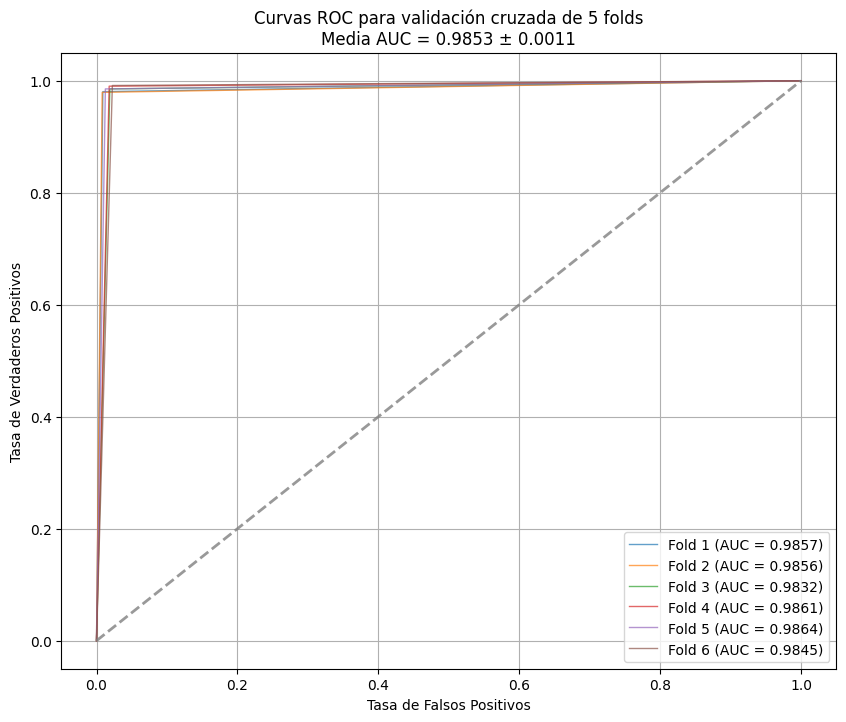

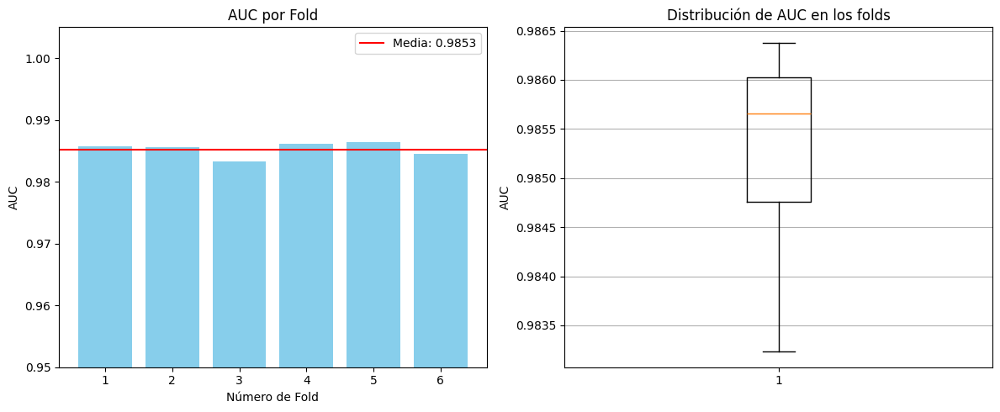

Mejor modelo: Fold 5 con AUC = 0.9864


In [23]:
# Graficar curvas ROC para todos los pliegues
plt.figure(figsize=(10, 8))

# Plotear curva ROC para cada pliegue
for i, ((fpr, tpr), roc_auc) in enumerate(zip(fold_roc_curves, fold_aucs)):
    plt.plot(fpr, tpr, lw=1, alpha=0.7, label=f'Fold {i+1} (AUC = {roc_auc:.4f})')

# Calcular media y desviación estándar del AUC
mean_auc = np.mean(fold_aucs)
std_auc = np.std(fold_aucs)

# Añadir línea de referencia
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='grey', alpha=.8)

# Configurar el gráfico
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title(f'Curvas ROC para validación cruzada de 5 folds\nMedia AUC = {mean_auc:.4f} ± {std_auc:.4f}')
plt.legend(loc="lower right")
plt.grid(True)

plt.show()

# Encontrar el mejor modelo basado en el AUC
best_model_idx = np.argmax(fold_aucs)
best_model = fold_models[best_model_idx]
best_auc = fold_aucs[best_model_idx]

# Crear un resumen de los resultados
plt.figure(figsize=(12, 5))

# Gráfico de barras para AUC por pliegue
plt.subplot(1, 2, 1)
plt.ylim([0.95, 1.005])
plt.bar(range(1, n_folds+1), fold_aucs, color='skyblue')
plt.axhline(y=mean_auc, color='red', linestyle='-', label=f'Media: {mean_auc:.4f}')
plt.xlabel('Número de Fold')
plt.ylabel('AUC')
plt.title('AUC por Fold')
plt.xticks(range(1, n_folds+1))
plt.legend()

# Boxplot para visualizar la distribución de AUC
plt.subplot(1, 2, 2)
plt.boxplot(fold_aucs)
plt.ylabel('AUC')
plt.title('Distribución de AUC en los folds')
plt.grid(True, axis='y')

plt.tight_layout()
#plt.savefig('resumen_kfold.png', dpi=300, bbox_inches='tight')
plt.show()

print(f'Mejor modelo: Fold {best_model_idx+1} con AUC = {best_auc:.4f}')

## Mejor modelo

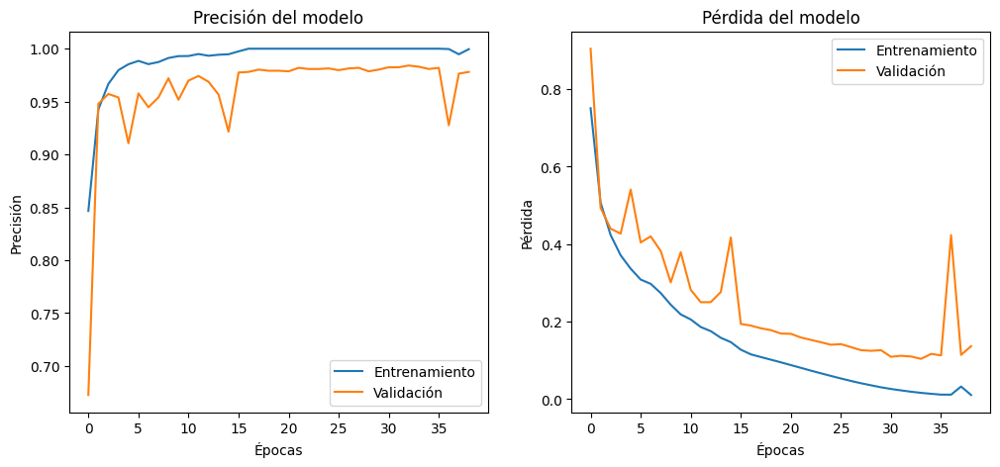

In [24]:
history = fold_histories[best_model_idx]
plt.figure(figsize=(12, 5))

# Precisión
plt.subplot(1, 2, 1)
plt.plot(history['accuracy'], label='Entrenamiento')
plt.plot(history['val_accuracy'], label='Validación')
plt.title('Precisión del modelo')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

# Pérdida
plt.subplot(1, 2, 2)
plt.plot(history['loss'], label='Entrenamiento')
plt.plot(history['val_loss'], label='Validación')
plt.title('Pérdida del modelo')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()

plt.show()

## Guardado de modelos

In [25]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [26]:
# Obtener la fecha y hora actual en formato YYYYMMDD_HHMMSS
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")

# Definir la carpeta en Google Drive donde se guardarán los modelos
drive_folder = "/content/drive/My Drive/models/"

# Crear la carpeta si no existe
os.makedirs(drive_folder, exist_ok=True)

densenet_model_filename = f"densenet_cancer_model_{timestamp}.h5"
densenet_model_path = os.path.join(drive_folder, densenet_model_filename)

# Guardar el modelo en formato HDF5
best_model.save(densenet_model_path)
print(f"Modelo DenseNet guardado en: {densenet_model_path}")
# Listar los archivos guardados en la carpeta de Google Drive
print("Modelos guardados en Google Drive:")
print(os.listdir(drive_folder))

Modelo DenseNet guardado en: /content/drive/My Drive/models/densenet_cancer_model_20250313_165208.h5
Modelos guardados en Google Drive:
['densenet_cancer_model_20250313_011421.h5', 'densenet_cancer_model_20250313_165208.h5']


## Resultados finales

In [27]:
# Predice y visualiza imágenes del conjunto de prueba X_test.
def predict_test_images(X_test, y_test, model, num_images=10, random_seed=None):
    # Configurar semilla para reproducibilidad si se proporciona
    if random_seed is not None:
        np.random.seed(random_seed)

    # Seleccionar índices aleatorios
    total_images = len(X_test)
    if num_images > total_images:
        num_images = total_images
        print(f"Se ajustó el número de imágenes a {total_images} (el total disponible)")

    indices = np.random.choice(range(total_images), num_images, replace=False)

    # Determinar el número de filas y columnas para la visualización
    cols = 5  # 5 imágenes por fila
    rows = (num_images + cols - 1) // cols  # Redondear hacia arriba

    # Crear una figura grande para todas las imágenes
    plt.figure(figsize=(20, 4 * rows))

    # Lista para almacenar resultados
    results = []

    for i, idx in enumerate(indices):
        # Obtener la imagen y su etiqueta real
        img = X_test[idx]
        true_label = y_test[idx]
        true_class = "Maligno" if true_label == 1 else "Benigno"

        # Asegurarse de que la imagen esté en el formato correcto para predecir
        img_array = np.expand_dims(img, axis=0)  # Añadir dimensión de batch

        # Realizar la predicción
        prediction = model.predict(img_array, verbose=0)

        # Obtener la clase predicha
        class_idx = np.argmax(prediction[0])
        class_prob = prediction[0][class_idx] * 100  # Convertir a porcentaje
        class_name = "Maligno" if class_idx == 1 else "Benigno"

        # Determinar si la predicción es correcta
        is_correct = class_idx == true_label

        # Guardar resultados
        results.append({
            'index': idx,
            'true_label': true_label,
            'true_class': true_class,
            'pred_class': class_name,
            'pred_prob': class_prob,
            'is_correct': is_correct,
            'benign_prob': prediction[0][0] * 100,
            'malignant_prob': prediction[0][1] * 100
        })

        # Añadir a la visualización
        plt.subplot(rows, cols, i + 1)

        # Asegurarse de que la imagen esté en el formato correcto para mostrar
        img_display = img.copy()
        if img_display.max() <= 1.0:
            img_display = img_display * 255  # Desnormalizar si es necesario

        plt.imshow(img_display.astype('uint8'))

        # Color del título basado en si la predicción es correcta (verde) o incorrecta (rojo)
        title_color = 'green' if is_correct else 'red'

        plt.title(f"Real: {true_class}\nPred: {class_name} ({class_prob:.4f}%)",
                  color=title_color)
        plt.axis('off')

    # Ajustar el espaciado
    plt.tight_layout()
    plt.show()

    # Imprimir un resumen de los resultados
    print("\nResumen de predicciones:")
    print("------------------------")
    correct_count = sum(1 for r in results if r['is_correct'])
    accuracy = correct_count / num_images * 100

    print(f"Total de imágenes: {num_images}")
    print(f"Predicciones correctas: {correct_count} ({accuracy:.2f}%)")
    print(f"Predicciones incorrectas: {num_images - correct_count} ({100 - accuracy:.2f}%)")

    # Calcular estadísticas por clase
    true_benign = sum(1 for r in results if r['true_class'] == 'Benigno')
    true_malignant = sum(1 for r in results if r['true_class'] == 'Maligno')

    correct_benign = sum(1 for r in results if r['true_class'] == 'Benigno' and r['is_correct'])
    correct_malignant = sum(1 for r in results if r['true_class'] == 'Maligno' and r['is_correct'])

    if true_benign > 0:
        print(f"Precisión en clase Benigno: {correct_benign}/{true_benign} ({correct_benign/true_benign*100:.4f}%)")
    if true_malignant > 0:
        print(f"Precisión en clase Maligno: {correct_malignant}/{true_malignant} ({correct_malignant/true_malignant*100:.4f}%)")
    return results
#  Genera un mapa de calor Grad-CAM para una imagen de entrada.
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):

    grad_model = tf.keras.models.Model(
        [model.input], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Calcular gradientes de la clase de interés respecto a la activación de la última capa convolucional
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])  # Tomar la clase predicha automáticamente
        loss = predictions[:, pred_index]

    # Calcular gradientes de la clase con respecto a las activaciones de la capa convolucional
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Convertir `conv_outputs` a NumPy para evitar errores de inmutabilidad
    conv_outputs = conv_outputs[0].numpy()
    pooled_grads = pooled_grads.numpy()

    # Ponderar las activaciones de la última capa convolucional con los gradientes calculados
    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    # Obtener el mapa de calor promedio
    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)  # ReLU: eliminar valores negativos
    heatmap /= np.max(heatmap)  # Normalizar a [0,1]

    return heatmap

# Superpone el mapa de calor sobre la imagen original
def overlay_heatmap(img, heatmap, alpha=0.5):
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))  # Redimensionar al tamaño de la imagen original
    heatmap = np.uint8(255 * heatmap)  # Convertir a escala de 0-255
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # Aplicar colormap
    superimposed_img = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)  # Combinar imágenes
    return superimposed_img

# Función para mostrar imágenes con Grad-CAM en un grid
def plot_gradcam_grid(images, model, last_conv_layer_name, labels=None, num_cols=4, alpha=0.5):
    num_images = len(images)
    num_rows = (num_images + num_cols - 1) // num_cols  # Calcular filas necesarias

    fig, axes = plt.subplots(num_rows * 2, num_cols, figsize=(15, 6 * num_rows))
    axes = axes.flatten()  # Asegurar iterabilidad

    for i, img in enumerate(images):
        img_array = np.expand_dims(img, axis=0)  # Expandir dimensión

        # Obtener predicción y mapa de calor
        heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
        heatmap_overlay = overlay_heatmap((img * 255).astype(np.uint8), heatmap, alpha)

        # Obtener predicción del modelo
        y_pred = model.predict(img_array)
        pred_class= np.argmax(y_pred[0])
        pred_score  = y_pred[0][pred_class]   # Convertir a porcentaje
        class_label = "Maligno" if pred_class == 1 else "Benigno"


        # Título con etiqueta real si está disponible
        title = f"Predicción: {class_label} ({pred_score * 100:.4f}%)"
        if labels is not None:
            title += f"\nReal: {'Maligno' if labels[i] == 1 else 'Benigno'}"

        # Mostrar imagen original arriba
        axes[i * 2].imshow((img * 255).astype(np.uint8))
        axes[i * 2].axis('off')
        axes[i * 2].set_title(f"Imagen Original\n{title}", fontsize=10)

        # Mostrar imagen con Grad-CAM abajo
        axes[i * 2 + 1].imshow(heatmap_overlay)
        axes[i * 2 + 1].axis('off')
        axes[i * 2 + 1].set_title(f"Grad-CAM", fontsize=10)

    # Ocultar ejes vacíos si el número de imágenes no llena la cuadrícula
    for i in range(num_images * 2, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()




## Carga de modelo



In [28]:
# Crear el modelo con la misma arquitectura
model = create_model()

RUTA_MODEL = densenet_model_path
# RUTA_MODEL = '/content/drive/MyDrive/models/densenet_cancer_model_20250313_011421.h5'

# Cargar solo los pesos
model.load_weights(RUTA_MODEL)

# Compilar el modelo
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

## Visualización de predicciones

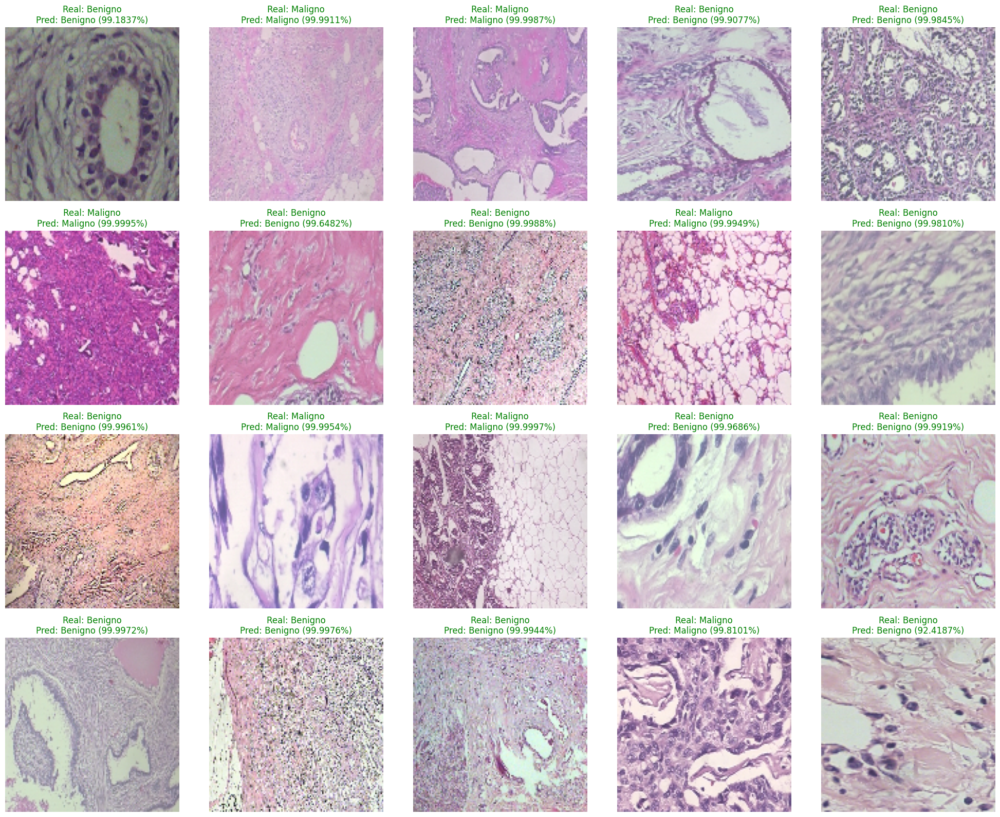


Resumen de predicciones:
------------------------
Total de imágenes: 20
Predicciones correctas: 20 (100.00%)
Predicciones incorrectas: 0 (0.00%)
Precisión en clase Benigno: 13/13 (100.0000%)
Precisión en clase Maligno: 7/7 (100.0000%)


In [29]:
results = predict_test_images(X_test, y_test, model, num_images=20, random_seed=42)

## Grad-CAM
El Grad-CAM (Gradient-weighted Class Activation Mapping) es una técnica que permite visualizar qué regiones de una imagen activaron más las capas profundas de una red neuronal para hacer una predicción.

In [30]:
img = X_test[15]  # Seleccionar la primera imagen de prueba
img_array = np.expand_dims(img, axis=0)  # Expandir dimensión para que tenga forma (1,128,128,3)

# Aplicar Grad-CAM
last_conv_layer_name = "conv5_block16_concat"  # Última capa convolucional en DenseNet121
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)


# Superponer el mapa de calor en la imagen original

# Convertir imagen original de [0,1] a [0,255] para visualizar correctamente
img_display = (img * 255).astype(np.uint8)
heatmap_overlay = overlay_heatmap(img_display, heatmap)


# Obtener la predicción del modelo
y_pred = model.predict(img_array)
pred_class = np.argmax(y_pred)  # 0 = Benigno, 1 = Maligno
class_label = "Maligno" if pred_class == 1 else "Benigno"

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_3119']
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


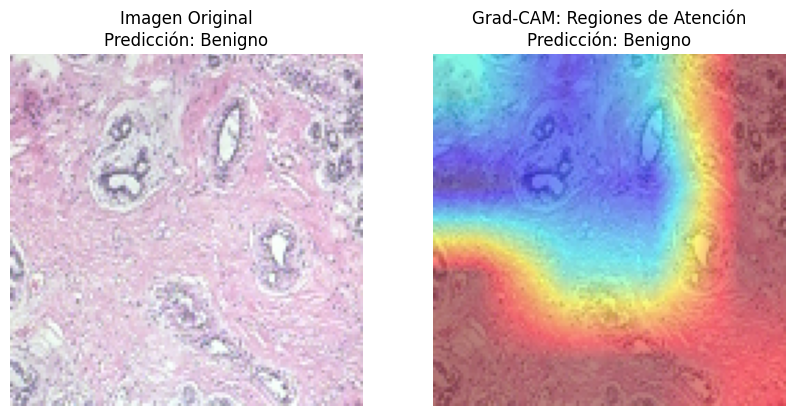

In [31]:
# Mostrar la imagen con la predicción y el mapa de calor
plt.figure(figsize=(10, 5))

# Imagen original
plt.subplot(1, 2, 1)
plt.imshow(img_display)
plt.axis('off')
plt.title(f"Imagen Original\nPredicción: {class_label}")

# Imagen con Grad-CAM
plt.subplot(1, 2, 2)
plt.imshow(heatmap_overlay)
plt.axis('off')
plt.title(f"Grad-CAM: Regiones de Atención\nPredicción: {class_label}")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


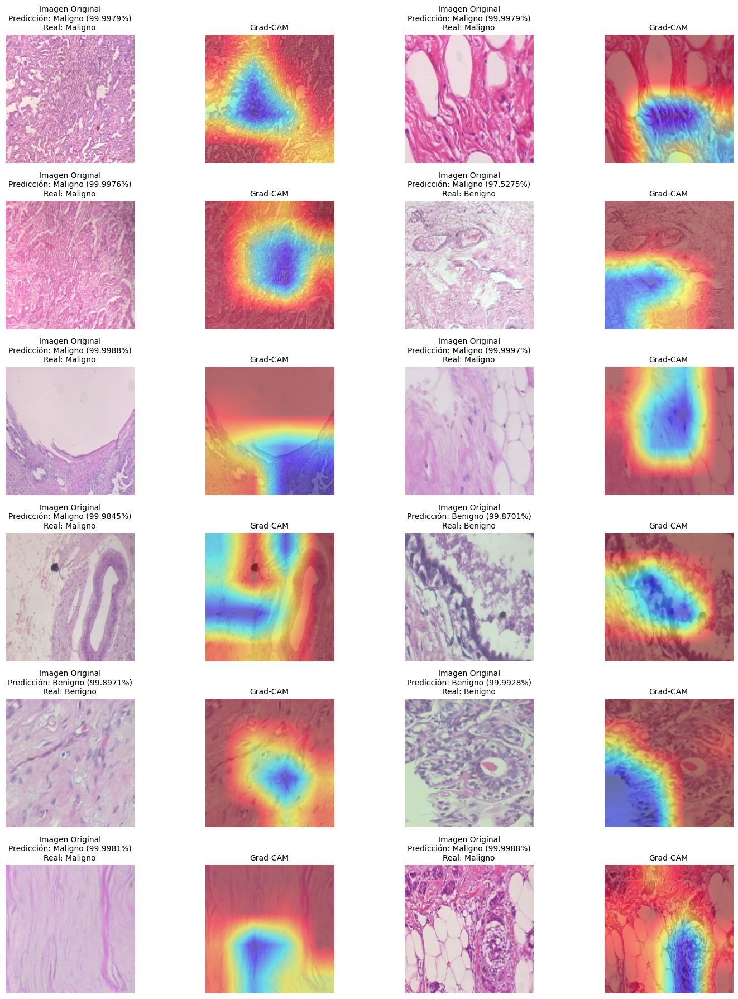

In [32]:
num_samples = 12
# Seleccionar índices aleatorios
random_indices = np.random.choice(len(X_test), num_samples, replace=False)

plot_gradcam_grid(X_test[random_indices], model, "conv5_block16_concat", labels=y_test[random_indices])